In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img

In [2]:
from tensorflow.keras.utils import image_dataset_from_directory

In [3]:
data = r'D:/data_science_archivos/cat vs dog/PetImages'


In [4]:
import os


In [5]:
input_path = []
label = []
for class_name in os.listdir(data):
  print(class_name)
  

Cat
Dog


In [6]:
input_path = []
label = []
for class_name in os.listdir(data):
  for path in os.listdir(data + '/' + class_name):
    print(path)

0.jpg
1.jpg
10.jpg
100.jpg
1000.jpg
10000.jpg
10001.jpg
10002.jpg
10003.jpg
10004.jpg
10005.jpg
10006.jpg
10007.jpg
10008.jpg
10009.jpg
1001.jpg
10010.jpg
10011.jpg
10012.jpg
10013.jpg
10014.jpg
10015.jpg
10016.jpg
10017.jpg
10018.jpg
10019.jpg
1002.jpg
10020.jpg
10021.jpg
10022.jpg
10023.jpg
10024.jpg
10025.jpg
10026.jpg
10027.jpg
10028.jpg
10029.jpg
1003.jpg
10030.jpg
10031.jpg
10032.jpg
10033.jpg
10034.jpg
10035.jpg
10036.jpg
10037.jpg
10038.jpg
10039.jpg
1004.jpg
10040.jpg
10041.jpg
10042.jpg
10043.jpg
10044.jpg
10045.jpg
10046.jpg
10047.jpg
10048.jpg
10049.jpg
1005.jpg
10050.jpg
10051.jpg
10052.jpg
10053.jpg
10054.jpg
10055.jpg
10056.jpg
10057.jpg
10058.jpg
10059.jpg
1006.jpg
10060.jpg
10061.jpg
10062.jpg
10063.jpg
10064.jpg
10065.jpg
10066.jpg
10067.jpg
10068.jpg
10069.jpg
1007.jpg
10070.jpg
10071.jpg
10072.jpg
10073.jpg
10074.jpg
10075.jpg
10076.jpg
10077.jpg
10078.jpg
10079.jpg
1008.jpg
10080.jpg
10081.jpg
10082.jpg
10083.jpg
10084.jpg
10085.jpg
10086.jpg
10087.jpg
10088.jpg
10

In [7]:
input_path = []
label = []
for class_name in os.listdir(data):
  for path in os.listdir(data + '/' + class_name):
    if class_name == 'Cat':
        label.append('0')
    else:
         label.append('1')
    input_path.append(os.path.join(data, class_name, path))

In [8]:
print(input_path[0])
print(label[0])

D:/data_science_archivos/cat vs dog/PetImages\Cat\0.jpg
0


In [9]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
#suffle data
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,D:/data_science_archivos/cat vs dog/PetImages\...,1
1,D:/data_science_archivos/cat vs dog/PetImages\...,0
2,D:/data_science_archivos/cat vs dog/PetImages\...,1
3,D:/data_science_archivos/cat vs dog/PetImages\...,1
4,D:/data_science_archivos/cat vs dog/PetImages\...,1


da error el entrenamiento
, veo si todas las imagenes son jpg

In [10]:
for i in df['images']:
    if 'jpg' not in i:
        print(i)

D:/data_science_archivos/cat vs dog/PetImages\Dog\Thumbs.db
D:/data_science_archivos/cat vs dog/PetImages\Cat\Thumbs.db


In [11]:
#borro
df = df[df['images']!= 'D:/data_science_archivos/cat vs dog/PetImages\Cat\Thumbs.db' ]
df = df[df['images']!= 'D:/data_science_archivos/cat vs dog/PetImages\Dog\Thumbs.db' ]


ver archivos corruptos:

In [12]:
import PIL
l = []

for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)

l

C:\Users\Usuario\anaconda3\Lib\site-packages\PIL\TiffImagePlugin.py:866: UserWarning: Truncated File Read
  warnings.warn(str(msg))


['D:/data_science_archivos/cat vs dog/PetImages\\Cat\\666.jpg',
 'D:/data_science_archivos/cat vs dog/PetImages\\Dog\\11702.jpg']

In [13]:
#borro los archivos corruptos
df = df[df['images']!= 'D:/data_science_archivos/cat vs dog/PetImages\\Cat\\666.jpg' ]
df = df[df['images']!= 'D:/data_science_archivos/cat vs dog/PetImages\\Dog\\11702.jpg' ]

# prueba

In [14]:
input_prueba = []
label_prueba = []
for class_name in os.listdir(data):
  for path in os.listdir(data + '/' + class_name):
    if class_name == 'Cat':
        label_prueba.append('0')
        input_prueba.append(path)
    else:
        label_prueba.append('1')
        input_prueba.append(path)
    

In [15]:
df_prueba = pd.DataFrame()
df_prueba['images'] = input_prueba
df_prueba['label'] = label_prueba
df_prueba.head()

,images,label
0,0.jpg,0
1,1.jpg,0
2,10.jpg,0
3,100.jpg,0
4,1000.jpg,0


In [16]:
temp = df[df['label']==1]['images']
temp

Series([], Name: images, dtype: object)

In [17]:
import random

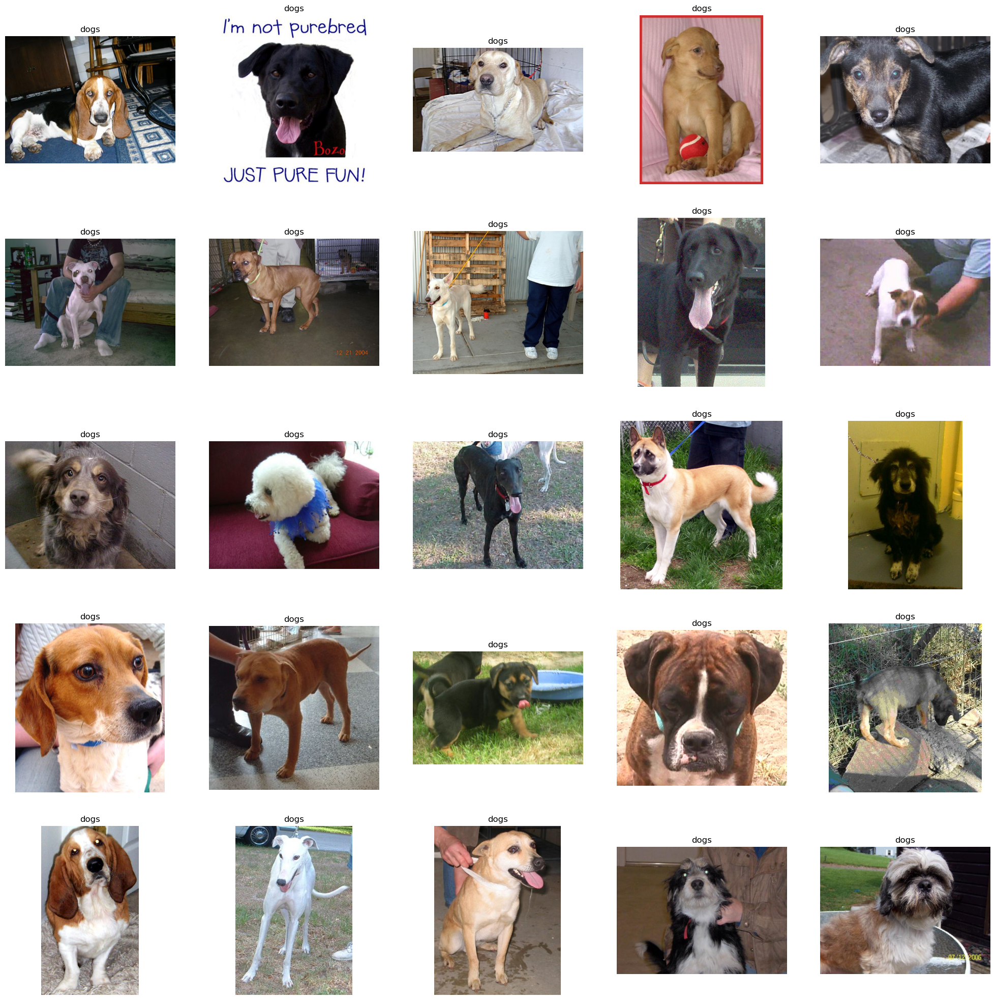

In [18]:
temp = df[df['label']=='1']['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]
          
plt.figure(figsize=(25,25))

for index, file in enumerate(files):
          plt.subplot(5,5, index + 1)
          img = load_img(file)
          img = np.array(img)
          plt.imshow(img)
          plt.title('dogs')
          plt.axis('off')

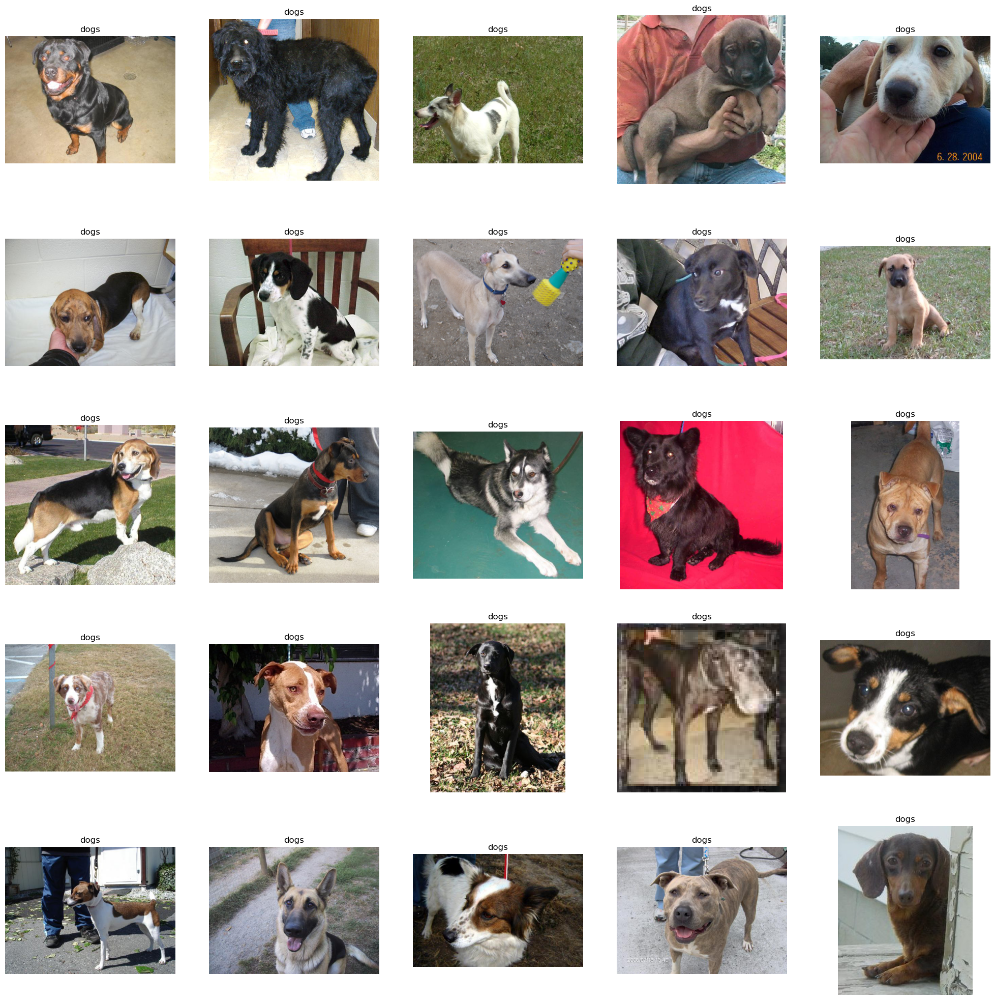

In [19]:
temp = df[df['label']=='1']['images']

files = temp[0:25]
          
plt.figure(figsize=(25,25))

for index, file in enumerate(files):
          plt.subplot(5,5, index + 1)
          img = load_img(file)
          img = np.array(img)
          plt.imshow(img)
          plt.title('dogs')
          plt.axis('off')

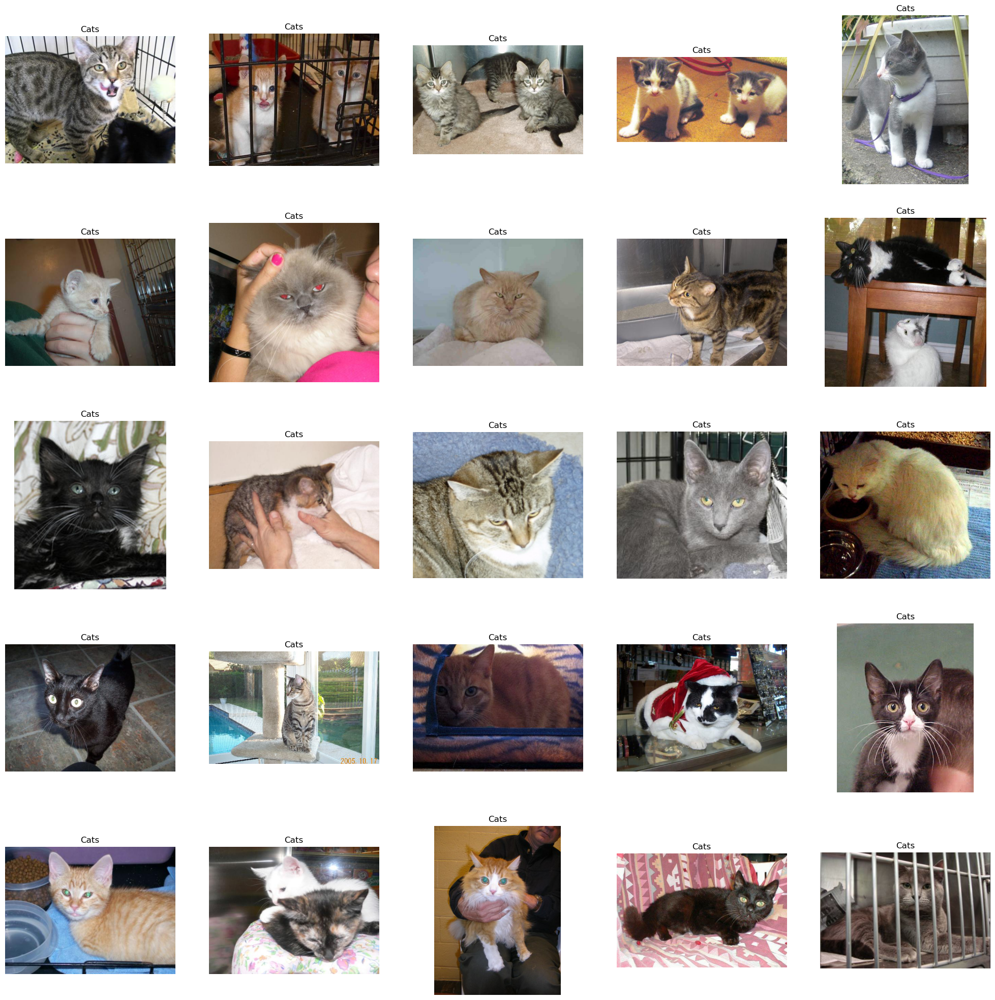

In [20]:
temp = df[df['label']=='0']['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]
          
plt.figure(figsize=(25,25))

for index, file in enumerate(files):
          plt.subplot(5,5, index + 1)
          img = load_img(file)
          img = np.array(img)
          plt.imshow(img)
          plt.title('Cats')
          plt.axis('off')

In [21]:
import seaborn as sns

In [22]:
df['label']

0        1
1        0
2        1
3        1
4        1
        ..
24997    1
24998    1
24999    0
25000    1
25001    1
Name: label, Length: 24998, dtype: object

<Axes: xlabel='label', ylabel='count'>

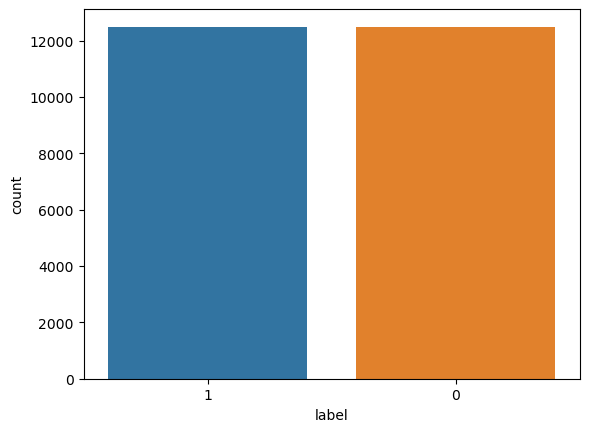

In [23]:
#sns.countplot(df['label'])

sns.countplot(df, x=df['label'])

In [24]:
from sklearn.model_selection import train_test_split

In [25]:
train, test = train_test_split(df, test_size=0.2, random_state=42)


In [26]:
test.head()

,images,label
6868,D:/data_science_archivos/cat vs dog/PetImages\...,1
22914,D:/data_science_archivos/cat vs dog/PetImages\...,0
9669,D:/data_science_archivos/cat vs dog/PetImages\...,0
13639,D:/data_science_archivos/cat vs dog/PetImages\...,1
23341,D:/data_science_archivos/cat vs dog/PetImages\...,0


In [27]:
from keras.preprocessing.image import ImageDataGenerator

In [28]:
train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
     fill_mode='nearest',
   
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col = 'images',
    y_col = 'label',
    target_size = (128,128),
    batch_size = 512,
    class_mode = 'binary'

)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col = 'images',
    y_col = 'label',
    target_size = (128,128),
    batch_size = 512,
    class_mode = 'binary'

)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [29]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense

In [30]:
model = Sequential([
    Conv2D(16, (3,3), activation = 'relu', input_shape = (128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation = 'relu'),
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation = 'relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation = 'relu'),
    Dense(1, activation = 'sigmoid')
    
    
])

In [31]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        

In [32]:
history = model.fit(train_iterator, epochs=50, validation_data=val_iterator)

Epoch 1/50


 1/40 [..............................] - ETA: 3:11 - loss: 0.6864 - accuracy: 0.5586

C:\Users\Usuario\anaconda3\Lib\site-packages\PIL\TiffImagePlugin.py:866: UserWarning: Truncated File Read
  warnings.warn(str(msg))


40/40 [==============================] - 118s 3s/step - loss: 0.7698 - accuracy: 0.5478 - val_loss: 0.6521 - val_accuracy: 0.6212
Epoch 2/50
40/40 [==============================] - 129s 3s/step - loss: 0.6444 - accuracy: 0.6248 - val_loss: 0.6143 - val_accuracy: 0.6576
Epoch 3/50
40/40 [==============================] - 134s 3s/step - loss: 0.6050 - accuracy: 0.6725 - val_loss: 0.5695 - val_accuracy: 0.6990
Epoch 4/50
40/40 [==============================] - 124s 3s/step - loss: 0.5782 - accuracy: 0.6922 - val_loss: 0.5812 - val_accuracy: 0.6982
Epoch 5/50
40/40 [==============================] - 124s 3s/step - loss: 0.5617 - accuracy: 0.7088 - val_loss: 0.6010 - val_accuracy: 0.6860
Epoch 6/50
40/40 [==============================] - 124s 3s/step - loss: 0.5611 - accuracy: 0.7103 - val_loss: 0.5166 - val_accuracy: 0.7348
Epoch 7/50
40/40 [==============================] - 124s 3s/step - loss: 0.5268 - accuracy: 0.7362 - val_loss: 0.4965 - val_accuracy: 0.7540
Epoch 8/50
40/40 [======

<Figure size 640x480 with 0 Axes>

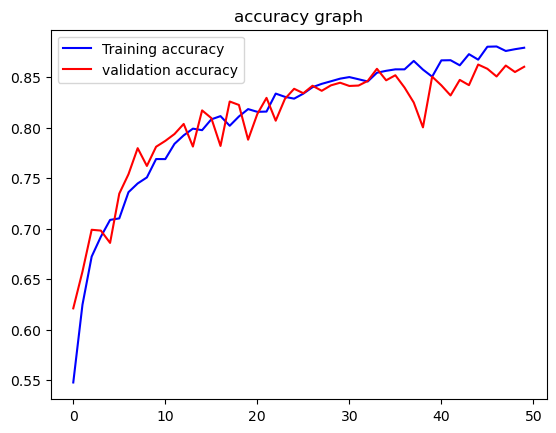

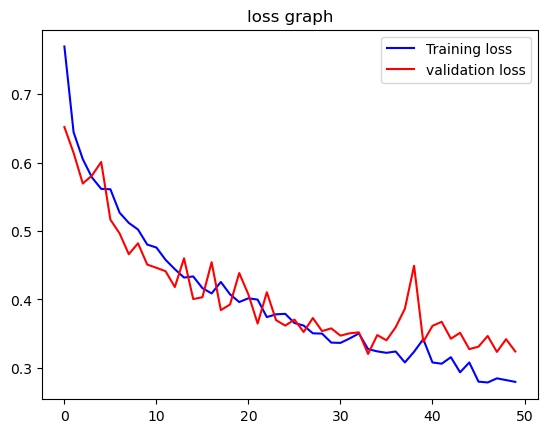

<Figure size 640x480 with 0 Axes>

In [38]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']


epochs = range(len(acc))



plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='validation accuracy')
plt.title('accuracy graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='validation loss')
plt.title('loss graph')
plt.legend()
plt.figure()